In [1]:
import os
import random
import torch
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
import timm  # Vision Transformer model support

# ✅ STEP 1: Replace this with the actual uploaded folder name from "Add Data"
dataset_dir = '/kaggle/input/lunghist'  # adjust if folder name differs


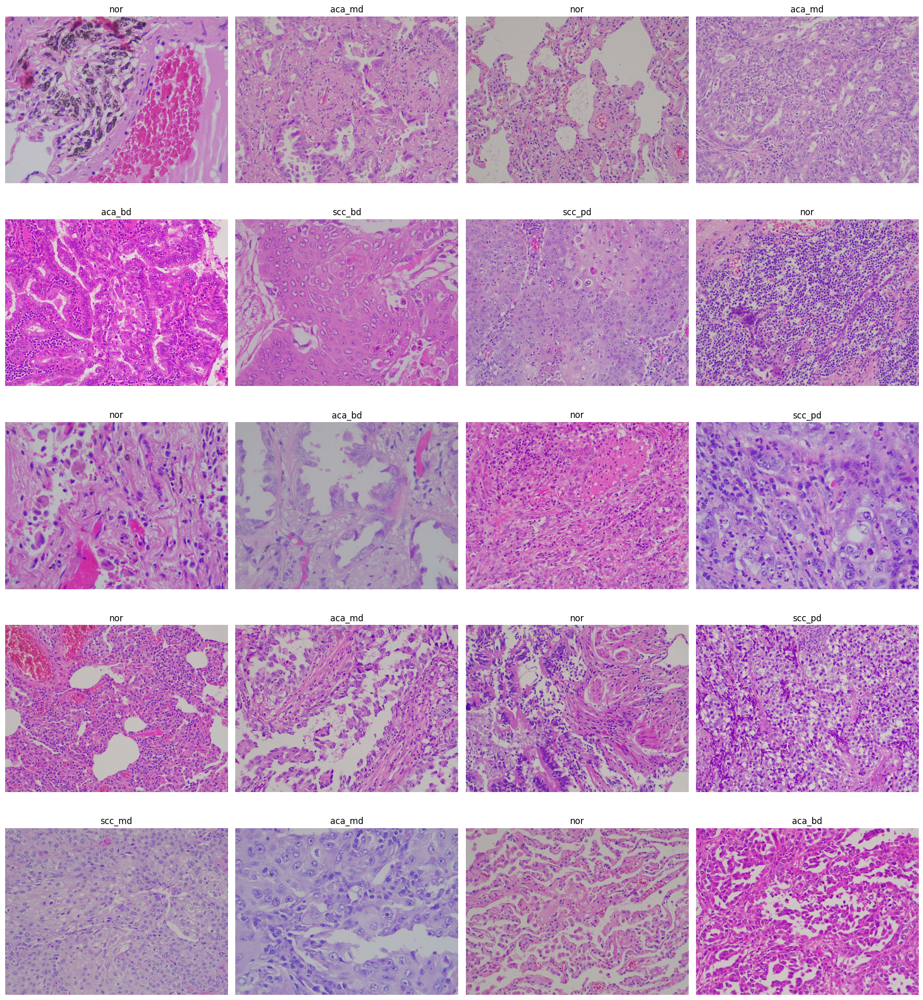

In [2]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

dataset_dir = '/kaggle/input/lunghist'

def show_random_img_from_dir(directory, num_img=10):
    img_files = []

    # Collect image file paths
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(root, file)
                img_files.append(img_path)

    if len(img_files) < num_img:
        print("Not enough images found in the directory.")
        return

    ran_img = random.sample(img_files, num_img)

    ncol = 4
    nrow = (num_img + ncol - 1) // ncol

    fig, axes = plt.subplots(nrow, ncol, figsize=(18, 4 * nrow))
    
    # Flatten axes to easily iterate and support single-row layouts
    axes = axes.flatten()

    for i, img_path in enumerate(ran_img):
        img = Image.open(img_path)
        ax = axes[i]
        ax.imshow(img)
        
        cls_name = os.path.basename(os.path.dirname(img_path))
        ax.set_title(cls_name)
        ax.axis('off')

    # Hide any unused subplots
    for j in range(num_img, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

show_random_img_from_dir(dataset_dir, num_img=20)


In [3]:
import gc
torch.cuda.empty_cache()
gc.collect()

# ✅ STEP 2: Custom Dataset
class CustomDataset(Dataset):
    def __init__(self, samples, transform=None):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label


In [4]:
# ✅ STEP 3: Dataset Split Function (Kaggle-safe)
from sklearn.model_selection import train_test_split

def split_dataset(data_dir, train_ratio=0.8):
    class_to_files = {}
    for root, _, files in os.walk(data_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                class_name = os.path.basename(root)
                path = os.path.join(root, file)
                class_to_files.setdefault(class_name, []).append(path)

    classes = sorted(class_to_files.keys())
    class_to_idx = {cls: idx for idx, cls in enumerate(classes)}
    train_samples, test_samples = [], []

    for cls in classes:
        files = class_to_files[cls]
        random.shuffle(files)
        split_idx = int(len(files) * train_ratio)
        train_files = files[:split_idx]
        test_files = files[split_idx:]
        train_samples += [(fp, class_to_idx[cls]) for fp in train_files]
        test_samples += [(fp, class_to_idx[cls]) for fp in test_files]
        print(f"📦 {cls}: {len(train_files)} train, {len(test_files)} test")

    return train_samples, test_samples, class_to_idx

train_data, test_data, class_to_idx = split_dataset(dataset_dir)


📦 aca_bd: 82 train, 21 test
📦 aca_md: 72 train, 18 test
📦 aca_pd: 69 train, 18 test
📦 nor: 120 train, 31 test
📦 scc_bd: 79 train, 20 test
📦 scc_md: 52 train, 14 test
📦 scc_pd: 76 train, 19 test


In [5]:
# ✅ STEP 4: Prepare Data
train_data, test_data, class_to_idx = split_dataset(dataset_dir)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])
train_dataset = CustomDataset(train_data, transform=transform)
test_dataset = CustomDataset(test_data, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


📦 aca_bd: 82 train, 21 test
📦 aca_md: 72 train, 18 test
📦 aca_pd: 69 train, 18 test
📦 nor: 120 train, 31 test
📦 scc_bd: 79 train, 20 test
📦 scc_md: 52 train, 14 test
📦 scc_pd: 76 train, 19 test


In [6]:
%matplotlib inline
from torch.utils.data import DataLoader

# Define DataLoaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)


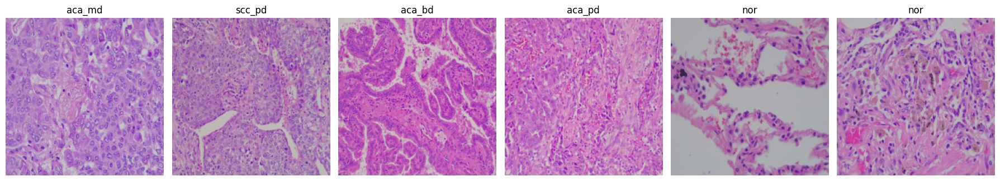

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline




def show_batch(dataloader, class_to_idx, max_images=8):
    inv_class_map = {v: k for k, v in class_to_idx.items()}
    data_iter = iter(dataloader)
    images, labels = next(data_iter)

    images = images[:max_images]
    labels = labels[:max_images]

    fig, axes = plt.subplots(1, max_images, figsize=(3 * max_images, 4))
    if max_images == 1:
        axes = [axes]

    for img, label, ax in zip(images, labels, axes):
        img = img.permute(1, 2, 0).numpy()
        img = (img * 0.5) + 0.5
        img = img.clip(0, 1)
        ax.imshow(img)
        ax.set_title(inv_class_map[label.item()])
        ax.axis('off')

    plt.tight_layout()
    plt.show()


show_batch(train_loader, class_to_idx, max_images=6)

# Example usage (requires transforms to include ToTensor())
# show_batch(train_loader, class_to_idx)


In [8]:
# ✅ Must run this before training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def train_model(model, train_loader, epochs=5):
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        print(f"✅ Epoch {epoch+1}, Loss: {total_loss/len(train_loader):.4f}")
    return model


# ✅ STEP 6: Model Evaluation
from collections import defaultdict
def evaluate_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    class_correct = defaultdict(int)
    class_total = defaultdict(int)
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            for label, pred in zip(labels, predicted):
                class_total[label.item()] += 1
                if label == pred:
                    class_correct[label.item()] += 1

    acc = 100 * correct / total
    print(f"📊 Total Accuracy: {acc:.2f}%")

    idx_to_class = {v: k for k, v in class_to_idx.items()}
    for cls_idx in class_total:
        cls_acc = 100 * class_correct[cls_idx] / class_total[cls_idx]
        print(f"🔹 {idx_to_class[cls_idx]} Accuracy: {cls_acc:.2f}%")

    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[idx_to_class[i] for i in range(len(idx_to_class))])
    fig, ax = plt.subplots(figsize=(8, 6))
    disp.plot(ax=ax, xticks_rotation=45, cmap='Blues', colorbar=False)
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig("confusion_matrix.png")  # Save it to a file
    plt.show()


    return acc
# ✅ STEP 7: Use Vision Transformer (ViT)

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

✅ Epoch 1, Loss: 2.0874
✅ Epoch 2, Loss: 1.9013
✅ Epoch 3, Loss: 1.8520
✅ Epoch 4, Loss: 1.7475
✅ Epoch 5, Loss: 1.6069
✅ Epoch 6, Loss: 1.4308
✅ Epoch 7, Loss: 1.3788
✅ Epoch 8, Loss: 1.2002
✅ Epoch 9, Loss: 1.0875
✅ Epoch 10, Loss: 1.0706
✅ Epoch 11, Loss: 0.9614
✅ Epoch 12, Loss: 0.8665
✅ Epoch 13, Loss: 0.8351
✅ Epoch 14, Loss: 1.0212
✅ Epoch 15, Loss: 0.8499
✅ Epoch 16, Loss: 0.6079
✅ Epoch 17, Loss: 0.5092
✅ Epoch 18, Loss: 0.5329
✅ Epoch 19, Loss: 0.4251
✅ Epoch 20, Loss: 0.4174
📊 Total Accuracy: 56.74%
🔹 aca_bd Accuracy: 52.38%
🔹 aca_md Accuracy: 66.67%
🔹 aca_pd Accuracy: 22.22%
🔹 nor Accuracy: 74.19%
🔹 scc_bd Accuracy: 85.00%
🔹 scc_md Accuracy: 14.29%
🔹 scc_pd Accuracy: 57.89%


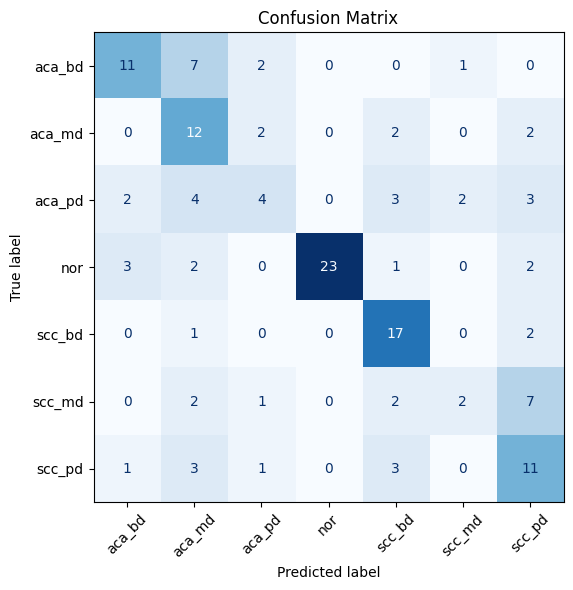

56.737588652482266

In [9]:
vit_model = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=len(class_to_idx))
vit_model = train_model(vit_model, train_loader, epochs=20)
evaluate_model(vit_model, test_loader)


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

✅ Epoch 1, Loss: 1.9196
✅ Epoch 2, Loss: 1.8561
✅ Epoch 3, Loss: 1.7832
✅ Epoch 4, Loss: 1.6620
✅ Epoch 5, Loss: 1.5043
✅ Epoch 6, Loss: 1.3654
✅ Epoch 7, Loss: 1.2185
✅ Epoch 8, Loss: 1.1252
✅ Epoch 9, Loss: 1.0394
✅ Epoch 10, Loss: 0.9159
✅ Epoch 11, Loss: 0.8604
✅ Epoch 12, Loss: 0.7837
✅ Epoch 13, Loss: 0.6838
✅ Epoch 14, Loss: 0.6786
✅ Epoch 15, Loss: 0.6053
✅ Epoch 16, Loss: 0.5492
✅ Epoch 17, Loss: 0.4858
✅ Epoch 18, Loss: 0.4104
✅ Epoch 19, Loss: 0.3940
✅ Epoch 20, Loss: 0.3893
📊 Total Accuracy: 70.92%
🔹 aca_bd Accuracy: 71.43%
🔹 aca_md Accuracy: 72.22%
🔹 aca_pd Accuracy: 50.00%
🔹 nor Accuracy: 87.10%
🔹 scc_bd Accuracy: 65.00%
🔹 scc_md Accuracy: 57.14%
🔹 scc_pd Accuracy: 78.95%


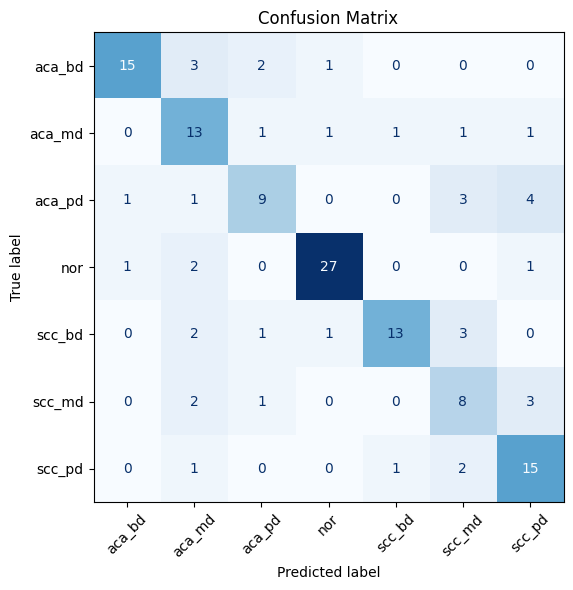

70.92198581560284

In [10]:
resnet_model = timm.create_model('resnet50', pretrained=True, num_classes=len(class_to_idx))
resnet_model = train_model(resnet_model, train_loader, epochs=20)
evaluate_model(resnet_model, test_loader)


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

✅ Epoch 1, Loss: 2.4324
✅ Epoch 2, Loss: 1.0303
✅ Epoch 3, Loss: 0.7639
✅ Epoch 4, Loss: 0.5580
✅ Epoch 5, Loss: 0.3375
✅ Epoch 6, Loss: 0.2707
✅ Epoch 7, Loss: 0.2309
✅ Epoch 8, Loss: 0.2128
✅ Epoch 9, Loss: 0.1602
✅ Epoch 10, Loss: 0.1403
✅ Epoch 11, Loss: 0.1592
✅ Epoch 12, Loss: 0.1013
✅ Epoch 13, Loss: 0.1430
✅ Epoch 14, Loss: 0.0985
✅ Epoch 15, Loss: 0.0738
✅ Epoch 16, Loss: 0.0467
✅ Epoch 17, Loss: 0.0669
✅ Epoch 18, Loss: 0.0445
✅ Epoch 19, Loss: 0.0506
✅ Epoch 20, Loss: 0.0539
✅ Epoch 21, Loss: 0.0861
✅ Epoch 22, Loss: 0.0503
✅ Epoch 23, Loss: 0.0791
✅ Epoch 24, Loss: 0.0387
✅ Epoch 25, Loss: 0.0785
📊 Total Accuracy: 66.67%
🔹 aca_bd Accuracy: 61.90%
🔹 aca_md Accuracy: 66.67%
🔹 aca_pd Accuracy: 66.67%
🔹 nor Accuracy: 90.32%
🔹 scc_bd Accuracy: 60.00%
🔹 scc_md Accuracy: 35.71%
🔹 scc_pd Accuracy: 63.16%


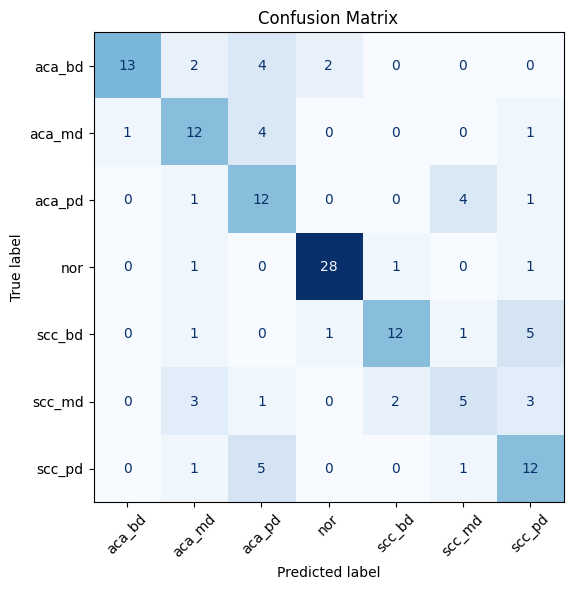

66.66666666666667

In [11]:
effi_model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=len(class_to_idx))

effi_model = train_model(effi_model, train_loader, epochs=25)
evaluate_model(effi_model, test_loader)

In [12]:
# ✅ Class label map (needed for decoding prediction)
idx_to_class = {v: k for k, v in class_to_idx.items()}

# ✅ Define prediction transform (NO augmentation)
predict_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# ✅ Function to predict a single image
def predict_image(image_path, model, transform, idx_to_class):
    model.eval()
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        _, pred = torch.max(output, 1)
        class_name = idx_to_class[pred.item()]

    # Show the image with prediction
    plt.imshow(image)
    plt.title(f"🔍 Predicted: {class_name}", fontsize=14)
    plt.axis('off')
    plt.show()

    print(f"🧬 Predicted Cancer Type: {class_name}")
    return class_name


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


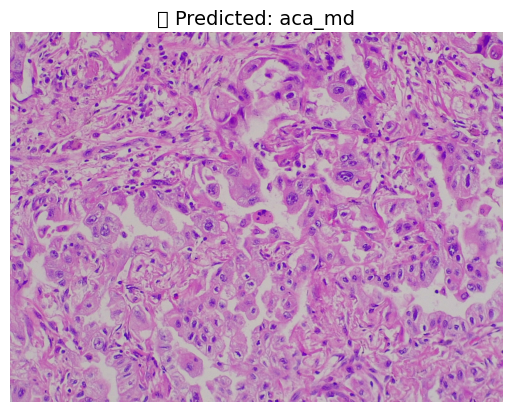

🧬 Predicted Cancer Type: aca_md


'aca_md'

In [13]:
image_path = "/kaggle/input/lunghist/data/images/aca_md/aca_md_20x_2.jpg"  # Change to your image path
predict_image(image_path, effi_model, predict_transform, idx_to_class)
